In [1]:
import numpy as np
import random
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import copy
import matplotlib.pyplot as plt

In [39]:
from google.colab import files
uploaded = files.upload()

Saving problem_2.npz to problem_2.npz


In [40]:
problem = np.load('problem_2.npz')
x = problem['x']
y = problem['y']
x.shape

(3, 5000)

In [5]:
def safe_sqrt(x):
    return np.sqrt(np.abs(x))
safe_sqrt.__name__ = "sqrt(abs)"

def safe_log(x):
    return np.log(np.abs(x) + 1e-9)
safe_log.__name__ = "log(abs)"

def safe_log10(x):
    return np.log10(np.abs(x) + 1e-9)
safe_log10.__name__ = "log10(abs)"


np_functions = [np.add, np.subtract, np.multiply, np.divide,np.maximum,np.minimum, np.power]
np_functions_1D=[safe_log, safe_log10, np.exp, np.sin, np.cos, np.tan, safe_sqrt,np.sign, np.square]

class Node:
    def __init__(self, a, children=[], action=None, result=None, leaf=False, text=''):
        self.x=a
        self.action = action
        self.children=children
        self.result = result
        self.text = text
        self.leaf=leaf
        if self.result is None:
            if leaf==True:
                if random.random()<0.2:
                    self.result=round(random.uniform(-50, 50),1)
                    self.text=str(self.result)
                else:
                    row_indice=random.choices(range(self.x.shape[0]), k=1)
                    self.result=self.x[row_indice[0]]
                    self.text='x'+str(row_indice)+''
            else:

                if len(self.children)==2:
                    if self.action is None:
                        self.action=random.choice(np_functions)

                    self.text='('+self.children[0].text+' '+self.action.__name__+' '+self.children[1].text+')'
                    self.result=self.action(self.children[0].result,self.children[1].result)
                else:
                    if self.action is None:
                        self.action=random.choice(np_functions_1D)
                    self.text=self.action.__name__+'('+self.children[0].text+')'
                    self.result=self.action(self.children[0].result)

    def update(self):
        if self.leaf==False:
            if len(self.children)==2:
                    self.text='('+self.children[0].text+' '+self.action.__name__+' '+self.children[1].text+')'
                    self.result=self.action(self.children[0].result,self.children[1].result)
            else:
                    self.text=self.action.__name__+'('+self.children[0].text+')'
                    self.result=self.action(self.children[0].result)


    def action_in_tree(self, function, child_node_pourcentage=0.5):
        if self.leaf==False:
            if len(self.children) == 2:
                i = random.randint(0, 1)
                if self.children[i].leaf == False and random.random() <= child_node_pourcentage:
                    self.children[i].action_in_tree(function, child_node_pourcentage)
                    self.update()
                elif self.children[1 - i].leaf == False and random.random() <= child_node_pourcentage:
                    self.children[1 - i].action_in_tree(function, child_node_pourcentage)
                    self.update()
                else:
                    function(self)
            elif len(self.children) == 1:
                if self.children[0].leaf == False and random.random() <= child_node_pourcentage:
                    self.children[0].action_in_tree(function, child_node_pourcentage)
                else:
                    function(self)

    def print_text(self):
        self.update()
        print(self.text)

    def change_action(self):
        if len(self.children)==2:
            self.action=random.choice(np_functions)
        else:
            self.action=random.choice(np_functions_1D)
        self.update()

    def create_leaf(self):
        self.leaf=True
        if random.random()<0.15:
            self.result=round(random.uniform(-50, 50),1)
            self.text=str(self.result)
        else:
            row_indice=random.choices(range(self.x.shape[0]), k=1)
            self.result=self.x[row_indice[0]]
            self.text='x'+str(row_indice)+''

    def cut_branch(self):
        if self.leaf==False:
            if len(self.children)==2:
                i=random.randint(0, 1)
                if self.children[i].leaf==False:
                    self.children[i].cut_branch()
                    self.update()
                elif self.children[1-i].leaf==False:
                    self.children[1-i].cut_branch()
                    self.update()
                else:
                    self.children=[]
                    self.create_leaf()
            else:
                if self.children[0].leaf==False:
                    self.children[0].cut_branch()
                    self.update()
                else:
                    self.children=[]
                    self.create_leaf()

    def expand_leaf(self):
        if self.leaf:
            self.children=[copy.deepcopy(self)]
            self.leaf=False
            for i in range(random.randint(0, 1)):
                self.children.append(Node(self.x, leaf=True))
            if len(self.children)==2:
                self.action=random.choice(np_functions)
            else:
                self.action=random.choice(np_functions_1D)
        else:
            if len(self.children)>0:
                random.choice(self.children).expand_leaf()
        self.update()

    def modify_leaf_number(self):
          if self.leaf and  "x" not in self.text:
              operation=random.choice(['multiply', 'divide'])
              while True:
                  factor = round(random.uniform(-1, 10), 1)
                  if factor != 0:
                      break
              if operation == 'multiply':
                  self.result*= factor
              elif operation == 'divide':
                  self.result=self.result/factor

              self.text = str(self.result)
              return True
          elif len(self.children)>0:

              shuffled_children=random.sample(self.children, len(self.children))
              for child in shuffled_children:
                  if child.modify_leaf_number():
                      self.update()
                      return True
          return False


    def depth(self):
        """
        Return the depth of the tree
        """
        if self.leaf:
            return 1
        return 1 + max(child.depth() for child in self.children)

    def random_branch(self,max_depth=5):
        """
        Cut a branch from the tree and return this branch (it can be the all tree).
        In reallity seing the construction of the tree this method return a random node from the tree.
        """
        if self.leaf:
            return self
        else:
            child=random.choice(self.children)
            if random.random()<(1/self.depth()) and self.depth()<max_depth: #The more we go closer to the end of the tree the more chance there is of a cut.
                return self
            else:
                return child.random_branch()

    def MSE(self,y):
        self.result=np.nan_to_num(self.result, nan=0.0)
        if not isinstance(self.result, np.ndarray):
            self.result =np.full_like(y, self.result, dtype=float)
        return mean_squared_error(self.result,y)

    def MAE(self,y):
        self.result=np.nan_to_num(self.result, nan=0.0)
        if not isinstance(self.result, np.ndarray):
            self.result =np.full_like(y, self.result, dtype=float)
        return mean_absolute_error(self.result,y)

    def R2(self,y):
        if not isinstance(self.result, np.ndarray):
            self.result = np.array([self.result])
        return r2_score(self.result,y)

    def calculate_alpha_beta(self, y):
        """
        Calculate and return the scalar alpha (covariance(y,self)/variance(self)) and beta (mean(y)-mean(self))
        This parameter recenter the result to have the same mean and variance as y.
        """
        result = copy.deepcopy(self.result)
        g_x = result.flatten()
        y_flat = y.flatten()
        g_x = np.nan_to_num(g_x, nan=0.0, posinf=0.0, neginf=0.0) #Check for any infiny or nan value and replace it by 0.
        y_flat = np.nan_to_num(y_flat, nan=0.0, posinf=0.0, neginf=0.0)
        covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
        variance=np.mean((g_x-np.mean(g_x))**2)
        alpha=covariance/variance if variance!=0 else variance
        beta=np.mean(y_flat)-alpha*np.mean(g_x)
        return alpha,beta

    def MSE_flexible(self, y):
        self.result = np.nan_to_num(self.result, nan=0.0, posinf=0.0, neginf=0.0)
        y = np.array(y).flatten()
        if not isinstance(self.result, np.ndarray):
            self.result = np.full_like(y, self.result, dtype=float)
        else:
            self.result = self.result.flatten()
        y = np.nan_to_num(y, nan=0.0, posinf=0.0, neginf=0.0)
        alpha, beta = self.calculate_alpha_beta(y)
        predictions=alpha*self.result+beta #Calculate the final MSE with alpha and beta calibrations
        predictions=np.nan_to_num(predictions, nan=0.0, posinf=0.0, neginf=0.0)
        return mean_squared_error(y, predictions)



In [6]:
def encapsule_node(node):
    return Node(node.x,children=[node])

In [7]:
def create_random_tree(a, depth=4):
    if depth == 0 or random.random() < 0.3:
        return Node(a,leaf=True)
    if random.random()<0.7:
        left_child = create_random_tree(a,depth - 1)
        right_child = create_random_tree(a,depth - 1)
        return Node(x,children=[left_child,right_child])
    else:
        child = create_random_tree(a,depth - 1)
        return Node(x,children=[child])

In [8]:
def select_best_tree(a, y_target, num_trees=10000, max_depth=3):
    best_tree = None
    best_mse = float('inf')

    for _ in range(num_trees):
        tree = create_random_tree(a, depth=max_depth)

        mse = tree.MSE( y_target)
        if mse < best_mse:
            best_tree = tree
            best_mse = mse

    return best_tree, best_mse

In [9]:
def create_neighbor(tree, max_depth=9,actions=["cut_branch", "expand_leaf","change_action","modify_leaf_number","encapsulate"],weights=[1,1,0.5,0.2,1]):
  #I tried with different recurence of mutation (some take more time to compute like modify_leaf because they need to go through the all tree so I tried to limit them.)
    neighbor = copy.deepcopy(tree)
    if tree.depth()>max_depth:
        weights[actions.index("expand_leaf")] = 0
        weights[actions.index("encapsulate")] = 0
    if tree.leaf==True:
        weights[actions.index("cut_branch")] = 0
        weights[actions.index("change_action")] = 0
    action = random.choices(actions, weights=weights, k=1)[0]
    if action == "cut_branch":
        neighbor.cut_branch()
    elif action == "encapsulate":
        neighbor=encapsule_node(neighbor)
    elif action == "expand_leaf":
        neighbor.expand_leaf()
    elif action == "change_action":
        neighbor.action_in_tree(Node.change_action)
    elif action =="modify_leaf_number":
        if not neighbor.modify_leaf_number():
            create_neighbor(tree,actions=["cut_branch", "expand_leaf","encapsulate"],weights=[1,1,0.5])
    return neighbor

In [10]:
class Tree_Problem:
    def __init__(self, a,b):
        self.a=a
        self.b=b
        self.tree=create_random_tree(self.a)
    def random_solution(self):
        return create_random_tree(self.a)
    def value(self,tree):
        return tree.MSE(self.b)

    def neighbour(self, tree):
        return create_neighbor(tree)

# Simulated Annealing

In [ ]:
def exponential_schedule(temperature=1000, alpha=0.8, limit=100):#This function describe the evolution of the temperature
    return lambda t: (temperature * np.exp(-alpha * t) if t < limit else 1e-3)

def simulated_annealing(problem, max_iterations=50,schedule=exponential_schedule(), max_evaluations=1000,current_solution=problem.random_solution()):
    # Initialisation de la solution
    current_solution = current_solution
    current_value = problem.value(current_solution)
    best_solution = current_solution
    best_value = current_value
    num_evaluations = 1
    costs = [current_value]
    temperature =schedule(0) #Initial temperature
    t=1
    fit_list=[]
    while num_evaluations < max_evaluations and temperature >0:
        neighbour_solution=problem.neighbour(current_solution)
        neighbour_value=problem.value(neighbour_solution)
        num_evaluations+=1
        fit_list.append([neighbour_solution,neighbour_value])
        costs.append(neighbour_value)

        if neighbour_value<current_value:
            current_solution=neighbour_solution
            current_value=neighbour_value
            if current_value<best_value:
                best_solution = current_solution
                best_value = current_value

        else:
            probability = np.exp((current_value-neighbour_value)/temperature)
            if random.random()<probability:
                current_solution=neighbour_solution
                current_value=neighbour_value

        #We calculate the temperature (cooling it down)
        temperature=schedule(t)
        t+=1# Increment time step


    return best_solution, best_value, num_evaluations, costs, fit_list


# Genetic Algorithm

In [11]:
def init_population(problem,population_size):
    pop=[]
    for i in range(population_size):
        pop.append(create_random_tree(problem.a))
    return pop

## Using MSE

In [ ]:
#combines elitism and rank selections.
#Rank selection in GA chooses individuals based on their relative performance rather than their actual fitness scores.
#Elitism directly selects the best individuals (elites) based on their fitness (price).
def select_elitismRank(problem, population,n_population,elite_size):#n_population is number of individuals wanted
    #and elite_size is the ratio of elite values in the said population
    # Select best roll (elites) directly
    n_elites = int(elite_size * n_population)
    elites = sorted(population, key=lambda tree: tree.MSE(problem.b), reverse=False)[:n_elites]
    #First we are sorting the values from the worst fitness to the best
    ranked_population = sorted(population, key=lambda tree: tree.MSE(problem.b), reverse=False)
    #then we are creating the weigth going from 1 for the worst fitness and n_population for the best
    weights = range(1, len(population)+1)
    selected = random.choices(ranked_population, weights, k=n_population - n_elites)
    return elites + selected

In [ ]:
def genetic_algorithm(problem, population_size=100, generations=70, elite_size=0.2, selection_func=select_elitismRank):
    # Initialize the population
    population = init_population(problem,population_size)
    best_tree = min(population, key=lambda tree: tree.MSE(problem.b))

    best_MSE = best_tree.MSE(problem.b)
    print(best_MSE)
    fit_list=[]
    no_improvement_streak = 0
    # Evolution loop
    for _ in range(generations):
        new_population = []
        # Apply crossover and mutation
        for i in range(population_size):
            parents = selection_func(problem, population,15,elite_size)
            parent1,parent2=random.sample(parents,2)
            child = Node(problem.a, children=[parent1.random_branch(),parent2.random_branch()])
            child = create_neighbor(child)
            new_population.append(child)

        # Replace old population with new population
        population = new_population
        current_best_tree =  min(new_population, key=lambda tree: tree.MSE(problem.b))
        current_best_MSE = current_best_tree.MSE(problem.b)
        print(current_best_MSE)
        if current_best_MSE < best_MSE:
            best_MSE = current_best_MSE
            best_tree = current_best_tree
            no_improvement_streak = 0
        else:
            no_improvement_streak += 1
        print(no_improvement_streak)
        if no_improvement_streak > 15:
            population = init_population(problem,population_size)
            break
        print(best_MSE)
        fit_list.append(best_MSE)
    return best_tree, best_MSE, fit_list,child, population



## Using MSE flexible

In [12]:
#combines elitism and rank selections.
#Rank selection in GA chooses individuals based on their relative performance rather than their actual fitness scores.
#Elitism directly selects the best individuals (elites) based on their fitness (price).
def select_elitismRank(problem, population,n_population,elite_size):#n_population is number of individuals wanted
    #and elite_size is the ratio of elite values in the said population
    # Select best roll (elites) directly
    n_elites = int(elite_size * n_population)
    elites = sorted(population, key=lambda tree: tree.MSE_flexible(problem.b), reverse=False)[:n_elites]
    #First we are sorting the values from the worst fitness to the best
    ranked_population = sorted(population, key=lambda tree: tree.MSE_flexible(problem.b), reverse=False)
    #then we are creating the weigth going from 1 for the worst fitness and n_population for the best
    weights = range(1, len(population)+1)
    selected = random.choices(ranked_population, weights, k=n_population - n_elites)
    return elites + selected

In [13]:
def genetic_algorithm(problem, population_size=60, generations=120, elite_size=0.2, selection_func=select_elitismRank):
    # Initialize the population
    population = init_population(problem,population_size)
    best_tree = min(population, key=lambda tree: tree.MSE_flexible(problem.b))

    best_MSE = best_tree.MSE_flexible(problem.b)
    print(best_MSE)
    fit_list=[]
    no_improvement_streak = 0
    # Evolution loop
    for _ in range(generations):
        new_population = []
        # Apply crossover and mutation
        for i in range(population_size):
            parents = selection_func(problem, population,10,elite_size)
            parent1,parent2=random.sample(parents,2)
            child = Node(problem.a, children=[parent1.random_branch(),parent2.random_branch()])
            child = create_neighbor(child)
            new_population.append(child)

        # Replace old population with new population
        population = new_population
        current_best_tree =  min(new_population, key=lambda tree: tree.MSE_flexible(problem.b))
        current_best_MSE = current_best_tree.MSE_flexible(problem.b)
        print(current_best_MSE)
        if current_best_MSE < best_MSE:
            best_MSE = current_best_MSE
            best_tree = current_best_tree
            no_improvement_streak = 0
        else:
            no_improvement_streak += 1
        print(no_improvement_streak)
        if no_improvement_streak > 10:
            num_to_cull = int(population_size * 0.9)
            population = sorted(population, key=lambda tree: tree.MSE_flexible(problem.b))[:-num_to_cull]
            new_individuals = init_population(problem, num_to_cull)
            population+=new_individuals
            no_improvement_streak = 0
        print(best_MSE)
        print(best_tree.text)
        fit_list.append(best_MSE)
    return best_tree, best_MSE, fit_list,child, population



### Problem 0

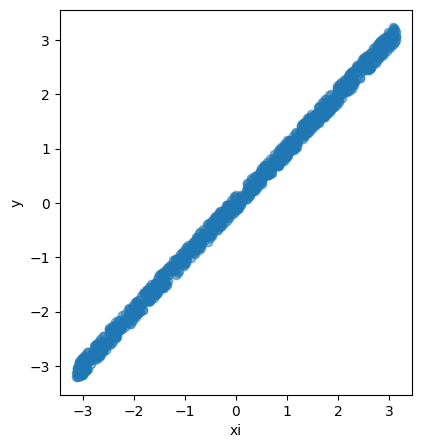

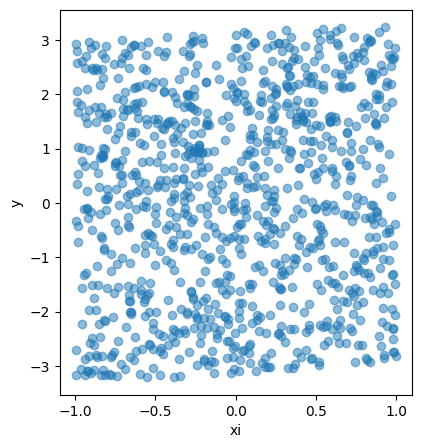

In [ ]:
for i in range(x.shape[0]):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x[i], y, alpha=0.5)
    plt.xlabel('xi')
    plt.ylabel('y')

In [14]:
problem = Tree_Problem(x, y)

In [ ]:
problem = Tree_Problem(x, y)
best_tree, best_MSE, fit_list, child, population= genetic_algorithm(
    problem,
)

<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


0.010675299032974568


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: ov

0.010675299032974568
1
0.010675299032974568
x[0]


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
0
0.010675299032974565
(x[0] add (-10.8 maximum -11.7))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.010675299032974565
1
0.010675299032974565
(x[0] add (-10.8 maximum -11.7))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974562
0
0.010675299032974562
((x[0] subtract 5.5) subtract (x[1] minimum (x[1] minimum -12.0)))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.010675299032974568
1
0.010675299032974562
((x[0] subtract 5.5) subtract (x[1] minimum (x[1] minimum -12.0)))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-949

0.010675299032974567
2
0.010675299032974562
((x[0] subtract 5.5) subtract (x[1] minimum (x[1] minimum -12.0)))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:5

0.010675299032974556
0
0.010675299032974556
([37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23

<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)


0.010675299032974563
1
0.010675299032974556
([37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23

<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:58: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid

0.01067529903297456
2
0.010675299032974556
([37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.230

<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.010675299032974553
0
0.010675299032974553
((x[0] subtract -15.0) add x[0])


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>

0.010675299032974546
0
0.010675299032974546
(sign(-9.600000000000001) add ((((x[0] add x[0]) subtract x[0]) subtract sign(-1.4769230769230772)) divide ([37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076

<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44:

0.010675299032974553
1
0.010675299032974546
(sign(-9.600000000000001) add ((((x[0] add x[0]) subtract x[0]) subtract sign(-1.4769230769230772)) divide ([37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076

<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44:

0.010675299032974542
0
0.010675299032974542
((((x[0] subtract -15.0) add x[0]) maximum exp(x[1])) add [37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.230769

<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow enco

0.010675299032974567
1
0.010675299032974542
((((x[0] subtract -15.0) add x[0]) maximum exp(x[1])) add [37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.230769

<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974568
2
0.010675299032974542
((((x[0] subtract -15.0) add x[0]) maximum exp(x[1])) add [37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.230769

<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44:

0.010675299032974567
3
0.010675299032974542
((((x[0] subtract -15.0) add x[0]) maximum exp(x[1])) add [37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.230769

<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55

0.010675299032974565
4
0.010675299032974542
((((x[0] subtract -15.0) add x[0]) maximum exp(x[1])) add [37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.230769

<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWa

0.010675299032974542
5
0.010675299032974542
((((x[0] subtract -15.0) add x[0]) maximum exp(x[1])) add [37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923 37.23076923
 37.23076923 37.230769

<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010563804095441044
0
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974568
1
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: Runt

0.010675299032974523
2
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974567
3
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974567
4
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b9

0.010675299032974565
5
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974523
6
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.01067529903297456
7
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010660880925996433
8
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.010675299032974468
9
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.01067529903297455
10
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a

0.010675299032974468
11
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974568
1
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974475
2
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
3
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974556
4
0.010563804095441044
(sign(x[0]) subtract (x[0] multiply 40.1))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010112025242050975
0
0.010112025242050975
(x[0] subtract ((3.0 power sin(x[1])) divide (x[0] minimum ([-225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -22

<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in powe

0.010675299032974568
1
0.010112025242050975
(x[0] subtract ((3.0 power sin(x[1])) divide (x[0] minimum ([-225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -22

<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974579
2
0.010112025242050975
(x[0] subtract ((3.0 power sin(x[1])) divide (x[0] minimum ([-225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -22

<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.010675299032974468
3
0.010112025242050975
(x[0] subtract ((3.0 power sin(x[1])) divide (x[0] minimum ([-225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -22

<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974468
4
0.010112025242050975
(x[0] subtract ((3.0 power sin(x[1])) divide (x[0] minimum ([-225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -22

<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.010675299032974504
5
0.010112025242050975
(x[0] subtract ((3.0 power sin(x[1])) divide (x[0] minimum ([-225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06 -225.06
 -225.06 -225.06 -22

<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b9

0.0033307788699363443
0
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: Runti

0.010675299032974457
1
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.01066386838392626
2
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
3
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974568
4
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44:

0.010617792544855885
5
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value 

0.010675299032974568
6
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010638080760262252
7
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWa

0.010604282472491107
8
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675175674292157
9
0.0033307788699363443
((12.5 multiply x[0]) add x[1])


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.0004936304208357298
0
0.0004936304208357298
(exp((x[1] divide -7.0)) subtract (26.2 minimum x[0]))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.00049363042083573
1
0.0004936304208357298
(exp((x[1] divide -7.0)) subtract (26.2 minimum x[0]))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.0012998081537737157
2
0.0004936304208357298
(exp((x[1] divide -7.0)) subtract (26.2 minimum x[0]))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.000490022285216326
0
0.000490022285216326
((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7)


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.0004900222852163257
0
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWa

0.010675299032974565
1
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: Runt

0.010675299032974565
2
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.010675299032974138
3
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44:

0.01067529903297444
4
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
5
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974482
6
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
7
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in divide
  self.result=sel

0.010675299032974565
8
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974568
9
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarnin

0.010674443418096856
10
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010674461301252281
11
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44:

0.010675299032974568
1
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010491519389161782
2
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974567
3
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.010675299028973373
4
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299028973285
5
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encou

0.006761325615191729
6
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:58: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.res

0.010658050351456064
7
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.010675299032974482
8
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974482
9
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010642885084783385
10
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010646332678640355
11
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: 

0.010646332678640286
1
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974138
2
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-4-949

0.010642885084783515
3
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid

0.010642885084783515
4
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
5
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974551
6
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55

0.010675299032974567
7
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:5

0.010675299032974565
8
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974568
9
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
10
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.00956714240148056
11
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
1
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974567
2
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: Runt

0.005861334936321395
3
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.0034592248792338844
4
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974567
5
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value 

0.010675299032974567
6
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountere

0.010675299032974568
7
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.010675299032974567
8
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974567
9
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: Run

0.010675299032974464
10
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: Runt

0.010675299032974567
11
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:

0.010675299032974567
1
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974568
2
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero

0.010675299032974556
3
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974553
4
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974553
5
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.010675299032974504
6
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.010675299032974553
7
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:49: Runt

0.009320372907223326
8
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.009320372907223326
9
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974562
10
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: o

0.010675299032974565
11
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
1
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning:

0.01067529903297456
2
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44:

0.010675299032974478
3
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.010675299032974478
4
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

0.010675299032974414
5
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b9

0.010675299032974565
6
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:

0.010675299032974567
7
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44:

0.010675299032974565
8
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: Ru

0.010675299032974568
9
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square


0.010675299032974565
10
0.0004900222852163257
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))


<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:210: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


In [ ]:
print("Best Formula:")
best_tree.print_text()
print("Best MSE:", best_MSE)

Best Formula:
(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -7.0)))) maximum -0.7) divide (5.2 power -8.8))
Best MSE: 0.0004900222852163257


In [ ]:
best_right_now=copy.deepcopy(best_tree)
for i in range(10000):
    cop_tree=copy.deepcopy(best_tree)
    cop_tree.modify_leaf_number()
    if cop_tree.MSE_flexible(y)<best_right_now.MSE_flexible(y):
        best_right_now=copy.deepcopy(cop_tree)

<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-4-9496b985fc6a>:55:

In [ ]:
best_right_now.MSE_flexible(y)

2.405706836938176e-05

In [ ]:
best_right_now.text

'(((sqrt(abs)(26.2) multiply (26.2 subtract (x[0] subtract (x[1] divide -5.6000000000000005)))) maximum -0.7) divide (5.2 power -8.8))'

Text(0, 0.5, 'y')

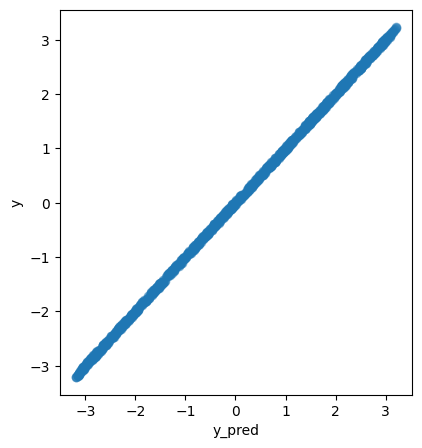

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

In [ ]:
alpha,beta

(-9.778889672523474e-08, 26.216037651353062)

In [19]:
def f0(x: np.ndarray) -> np.ndarray:
    return np.maximum(np.sqrt(np.abs(26.2)) * (26.2 - (x[0] - (x[1] / -5.6))), -0.7) / (5.2 ** -8.8) * -9.778889672523474e-08 + 26.216037651353062

In [17]:
x

array([[ 2.98832053, -0.25607889, -2.65339974, ...,  2.40210455,
        -0.9243268 , -2.83657593],
       [ 0.8905889 ,  0.13291573, -0.7681345 , ...,  0.70114202,
         0.47986195, -0.19768055]])

In [21]:
f0=f0(x)

In [28]:
n=Node(x,result=f0)

In [29]:
n.MSE_flexible(y)

2.4057068369381374e-05

### Problem 1

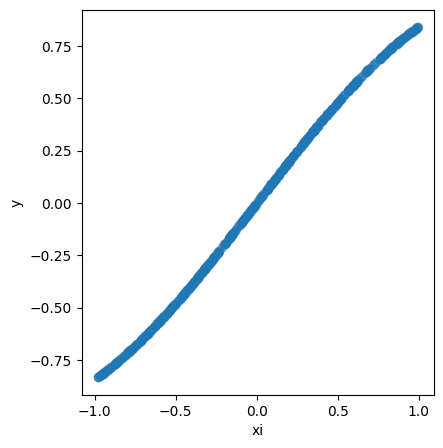

In [32]:
for i in range(x.shape[0]):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x[i], y, alpha=0.5)
    plt.xlabel('xi')
    plt.ylabel('y')

In [33]:
problem = Tree_Problem(x, y)
best_tree, best_MSE, fit_list, child, population= genetic_algorithm(
    problem,
)

<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


0.0005455347450329474


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  vari

0.0005455347450329409
0
0.0005455347450329409
tan((((-48.0 add (x[0] maximum x[0])) minimum sign(x[0])) multiply log10(abs)(sign(x[0]))))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.0005455347450329474
1
0.0005455347450329409
tan((((-48.0 add (x[0] maximum x[0])) minimum sign(x[0])) multiply log10(abs)(sign(x[0]))))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.00022922412523025928
0
0.00022922412523025928
((16.9 subtract square(x[0])) multiply (tan([4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 

<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


0.0005455347450329463
1
0.00022922412523025928
((16.9 subtract square(x[0])) multiply (tan([4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4

<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.0005455347450329348
2
0.00022922412523025928
((16.9 subtract square(x[0])) multiply (tan([4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4

<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:4

0.0005455347450329442
3
0.00022922412523025928
((16.9 subtract square(x[0])) multiply (tan([4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02
 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4.02 4

<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


3.921193366772412e-34
0
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.0005455347450329475
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: o

0.0005455347450329475
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41

0.0005455347450329475
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


0.0005455347450329475
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.00015012404529787387
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: Run

3.921193366772412e-34
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

3.921193366772412e-34
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encou

6.718848914518987e-05
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

6.894750802773985e-05
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWa

0.00015012404529787397
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarni

0.0005455347450329231
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

4.789067052594679e-33
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)


4.789067052594679e-33
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:5

0.00014858119926929768
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.00044254772418861956
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

3.921193366772412e-34
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.0005455347450329316
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52

0.000545534745032942
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:4

0.000545534745032942
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41

4.9461316012371733e-05
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

6.511235087167442e-29
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.00043289686293460804
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:4

0.00015012404529787397
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.0005439436413034678
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning

0.0005454748957270731
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  s

0.0001501240452978722
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  vari

0.0005455347450329471
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:5

0.0005455347450329471
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:

0.0005455347450329398
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children

3.921193366772412e-34
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  vari

3.921193366772412e-34
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


0.0005455347450329339
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.0005455347450329339
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.0005455347450329471
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.0005455347450329356
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

3.921193366772412e-34
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f

3.921193366772412e-34
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.000545534745032929
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>

0.00032596757117461404
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.0004670504822823389
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.000545116534734525
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.00042876210622432167
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: o

7.724779260714185e-29
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


2.0037159978918828e-32
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value enco

3.921193366772412e-34
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:55: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value 

9.52334591216985e-33
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: 

1.3696324526515512e-32
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.0005455347450329425
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero

0.0005455347450329425
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
 

0.0005455347450329425
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  vari

0.0005455347450329455
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  vari

0.0005455347450329351
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.0005451279605400212
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.0004662065404071667
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

3.921193366772412e-34
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:4

0.0005455332266589083
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: Runtime

0.0005455347450329316
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


3.921193366772412e-34
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


5.607359498182473e-26
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


5.607359498182473e-26
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: invalid value encountered in tan
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  s

5.607359498182473e-26
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:

3.921193366772412e-34
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)


1.0288654574961966e-30
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: Runt

1.0288654574961966e-30
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

1.6439062846204937e-06
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: o

3.521299035287078e-27
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid valu

3.921193366772412e-34
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


3.921193366772412e-34
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


0.0005277320599598716
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41

0.0005454549808239863
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.0005455347450329471
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: Runt

0.00034263476335849027
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41

0.00034263476335849027
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:4

3.921193366772412e-34
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

3.921193366772412e-34
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

3.921193366772412e-34
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

3.921193366772412e-34
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

0.0005455347450329413
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41

1.0288654574961966e-30
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value 

0.0005455347450329404
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


1.0288654574961966e-30
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4

5.977502749863588e-33
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:4

3.921193366772412e-34
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: Runt

0.00026139678879979
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


0.0005455347450328476
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: o

3.921193366772412e-34
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overfl

0.0005455347450328476
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in multiply
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4

0.0005455347450329475
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountere

3.921193366772412e-34
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: Runt

3.921193366772412e-34
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


3.921193366772412e-34
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


2.2348792001223297e-33
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: Runt

1.0470468605938113e-32
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


1.3016477274677895e-32
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52:

3.921193366772412e-34
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  vari

2.709386208701811e-33
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52

1.0304431793066387e-30
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: invalid value encountered in tan
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in sq

1.5426868878044663e-32
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


2.236637965366075e-32
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
 

0.0005455347450329474
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41:

0.00047016002671344435
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: Ru

0.00043949857291214483
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: Runt

3.338576989103737e-33
4
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning:

3.921193366772412e-34
5
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


0.00015012404529787397
6
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52

3.861399975709429e-05
7
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: overflow encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: overflow encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: Ru

3.921193366772412e-34
8
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


3.921193366772412e-34
9
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:4

6.511235087167442e-29
10
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:5

3.360048040037439e-30
11
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-5-47e52b7685f4>:207: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-

3.360048040037439e-30
1
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:5

3.921193366772412e-34
2
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-5-47e52b7685f4>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


3.360048040037439e-30
3
3.921193366772412e-34
sin((x[0] minimum (sign(x[0]) multiply x[0])))


<ipython-input-5-47e52b7685f4>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)


In [34]:
print("Best Formula:")
best_tree.print_text()
print("Best MSE:", best_MSE)

Best Formula:
sin((x[0] minimum (sign(x[0]) multiply x[0])))
Best MSE: 3.921193366772412e-34


Text(0, 0.5, 'y')

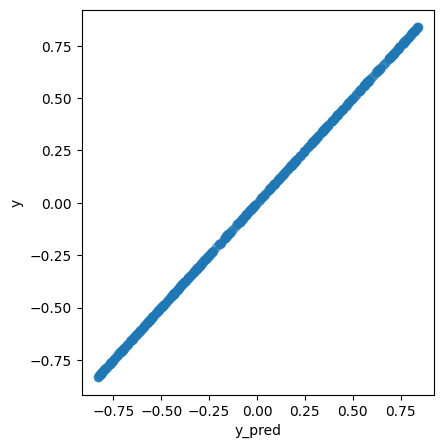

In [35]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(best_tree.result, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

In [36]:
alpha,beta=best_tree.calculate_alpha_beta(y)

In [37]:
alpha,beta

(1.0, 0.0)

Text(0, 0.5, 'y')

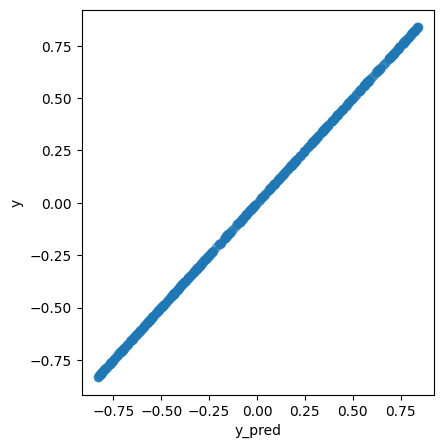

In [38]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

### Problem 2

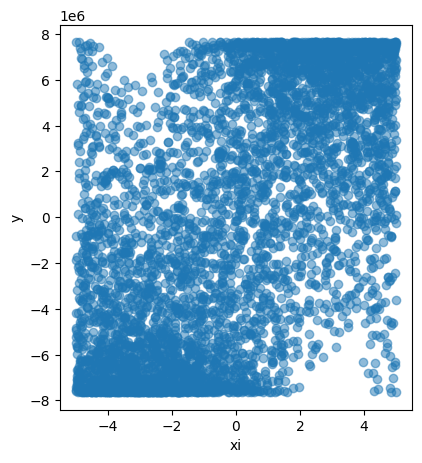

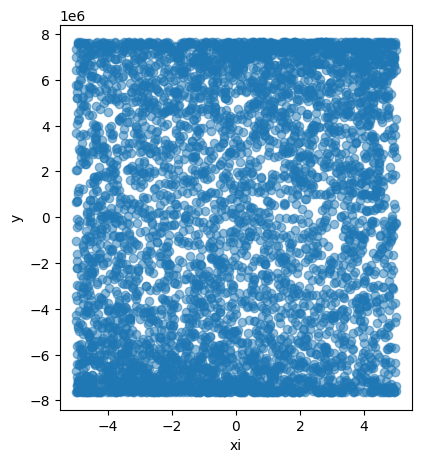

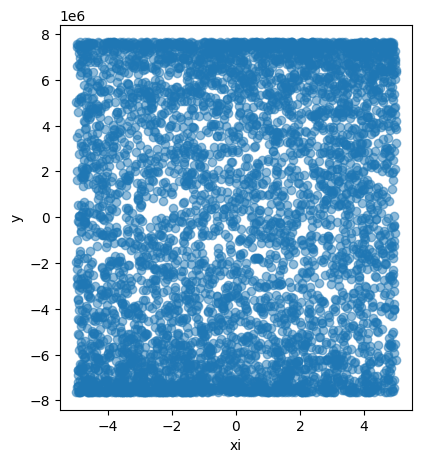

In [ ]:
for i in range(x.shape[0]):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x[i], y, alpha=0.5)
    plt.xlabel('xi')
    plt.ylabel('y')

In [ ]:
problem = Tree_Problem(x, y)
best_tree, best_MSE, fit_list, child, population = genetic_algorithm(
    problem,
)


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


19015154079298.246


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered

17859324179116.934
0
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!

18984169435725.383
1
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!

18648723338706.65
2
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x

17871185841292.94
3
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local

19015154079298.246
4
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18984169435725.383
5
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(

18901130594906.63
6
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squ

18898352943483.348
7
17859324179116.934
(sin(x[0]) add x[0])


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, a

18772030029962.758
8
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

19015154079298.246
9
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in p

19015154079298.246
10
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in

18446019617634.535
11
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squar

18984169435725.383
1
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: Runtime

18922243933271.06
2
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18984169435725.383
3
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-pac

18984169435725.383
4
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.child

18984169435725.383
5
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: invalid

18984169435725.383
6
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: Ru

18689284518909.39
7
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.m

18951040242395.91
8
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814ac

18984169435725.383
9
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18984169435725.383
10
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squar

17859324179116.934
11
17859324179116.934
(sin(x[0]) add x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814ac

17780375944113.992
0
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid

18984169435725.383
1
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-pac

18683942755317.62
2
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-pac

17859324179116.934
3
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18315419555118.816
4
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-

18315419555118.812
5
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.

18600787336434.387
6
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-inp

18984169435725.383
7
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in mul

18670683948947.04
8
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

19002227147198.645
9
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18984169435725.383
10
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflo

18984169435725.383
11
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(

18984169435725.383
1
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.

18984169435725.383
2
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squ

18955464778985.523
3
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.m

19015154079298.246
4
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:55: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value enc

18984169435725.383
5
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(

18984169435725.383
6
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18583467850701.848
7
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f58

18984169435725.383
8
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>

18190822973336.48
9
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(

18908897773663.67
10
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: Ru

17838060927510.61
11
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x

18984169435725.383
1
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: Runtime

19015154079298.246
2
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:5

19015154079298.246
3
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18966179502533.055
4
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18777698170730.164
5
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: ov

19015154079298.246
6
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200:

18397521362837.62
7
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

17941741343922.63
8
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18134441998791.848
9
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: i

18467355517877.945
10
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18835019385463.53
11
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in mul

19015154079298.246
1
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWa

18984169435725.383
2
17780375944113.992
(x[0] add tan(sin(x[0])))


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814ac

17069230393791.053
0
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, a

18984169435725.383
1
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow enc

19015154079298.246
2
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squar

18580620086171.44
3
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814ac

17798053655391.78
4
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-pac

18883738752316.434
5
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(

18883738752316.434
6
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.result

18883738752316.434
7
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local

18883738752316.434
8
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local

19015154071336.453
9
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdi

19012797011455.586
10
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18984169435725.383
11
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in r

19015154079298.246
1
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squar

18984169435725.383
2
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(

18892532745112.258
3
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipy

18039523955329.293
4
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in

18039523955329.293
5
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:5

18984169435725.383
6
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in mul

18984169435725.383
7
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
/usr/local/lib/python3.11/dist

18984169435725.383
8
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local

18984169435725.383
9
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local

18984169435725.383
10
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(

18730234146663.945
11
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipy

18575264804131.29
1
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>

18984169435725.383
2
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18702123564644.49
3
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814

18702123564644.49
4
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:55: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.r

18987551171805.336
5
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-pac

18984169435725.383
6
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squar

18984169435725.383
7
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814ac

18919849866262.836
8
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814a

18309454805698.88
9
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))

18984169435725.383
10
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-pac

18543718943860.53
11
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x

18880240406255.887
1
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814

19001286049167.438
2
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squar

19015154079298.246
3
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x

18984169435725.383
4
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWa

19015154079298.246
5
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18984169435725.383
6
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  var

18984169435725.383
7
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18904110596246.547
8
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: overflow enc

18577493449509.02
9
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local

19015154079298.246
10
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: o

18984169435725.383
11
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-n

18766245326482.67
1
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18984169435725.383
2
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:46: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide 

19015154079298.246
3
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np

19015154079298.246
4
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18755889604439.36
5
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squ

18984169435725.383
6
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_

18755889604439.36
7
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-pac

19015154079298.246
8
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in squ

18984169435725.383
9
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-pac

18683942755317.62
10
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:201: RuntimeWarning: invalid value encountered in scalar divide
  alpha=covariance/variance if variance!=0 else variance
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
<ipython-input-38-bb1f5814accb>:200: Ru

18683942755317.62
11
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:

19015154079298.25
1
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: overflow encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814acc

18244324927614.273
2
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:41: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:52: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWa

18180226177626.88
3
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local

19010561625930.695
4
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)
<ipython-input-38-bb1f5814accb>:199: RuntimeWarning: overflow encountered in multiply
  covariance=np.mean((g_x-np.mean(g_x))*(y_flat-np.mean(y_flat)))
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: o

18919849866262.836
5
17069230393791.053
(((x[2] multiply sign(x[1])) minimum (x[0] add x[2])) maximum x[0])


<ipython-input-38-bb1f5814accb>:200: RuntimeWarning: overflow encountered in square
  variance=np.mean((g_x-np.mean(g_x))**2)


In [ ]:
print("Best Formula:")
best_tree.print_text()
print("Best MSE:", best_MSE)

Best Formula:
sign((((square((x[1] add x[2])) multiply -29.7) power sign((square(x[1]) multiply -29.7))) subtract (48.7 multiply (x[1] add ((x[0] multiply (x[1] subtract -18.2)) add x[2])))))
Best MSE: 17489846309868.084


In [ ]:
best_right_now=copy.deepcopy(best_tree)
for i in range(10000):
    cop_tree=copy.deepcopy(best_tree)
    cop_tree.modify_leaf_number()
    if cop_tree.MSE_flexible(y)<best_right_now.MSE_flexible(y):
        best_right_now=copy.deepcopy(cop_tree)

Text(0.5, 1.0, 'Best solution score evolution for each iteration for problem 2')

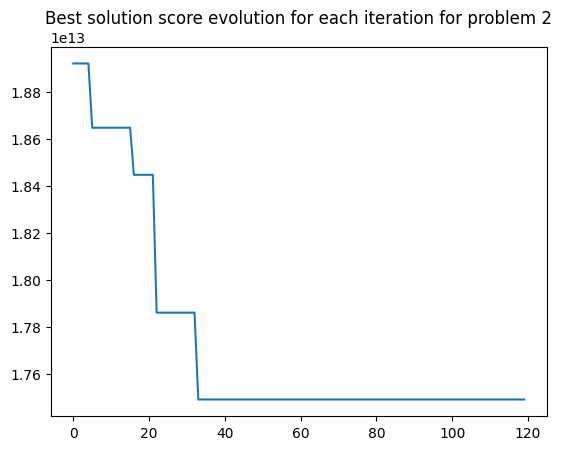

In [ ]:
plt.plot(fit_list)
plt.title("Best solution score evolution for each iteration for problem 2")

Text(0, 0.5, 'y')

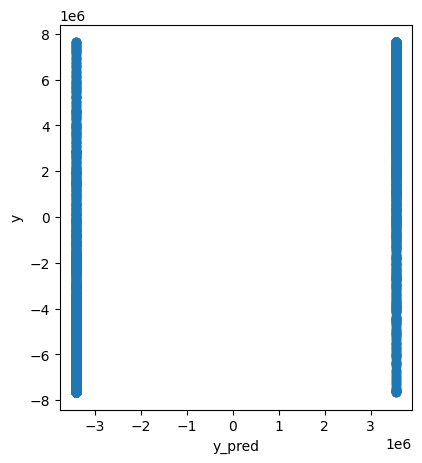

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

In [ ]:
alpha,beta

(-3481969.1114435066, 69000.19535928676)

### Problem 3

In [ ]:
problem = Tree_Problem(x, y)
best_tree, best_MSE, fit_list, child, population= genetic_algorithm(
    problem,
)

676.0864488660171


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


353.20230169566014
0
353.20230169566014
((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1])))


<ipython-input-238-65fa117b5e67>:59: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)


676.0864488660171
1
353.20230169566014
((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1])))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


360.64102026866544
2
353.20230169566014
((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1])))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


360.64102026866544
3
353.20230169566014
((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1])))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: invalid value encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


310.972684965911
0
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


310.972684965911
1
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


676.0864488660164
2
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


676.0111684800701
3
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


676.0111684800703
4
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0722027831598
5
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0722027831598
6
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0213933684831
7
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0213933684794
8
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0213933684831
9
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0072898906865
10
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0213933684814
11
310.972684965911
(x[2] sub

<ipython-input-238-65fa117b5e67>:50: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-238-65fa117b5e67>:59: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)


676.0213933684827
1
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9613575974416
2
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9613575974463
3
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9613282544644
4
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.072503964681
5
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0725039646821
6
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0725039252426
7
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0709739015296
8
310.972684965911
(x[2] subtra

<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:50: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-238-65fa117b5e67>:59: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)


676.0835157718757
1
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


676.0725039646815
2
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0725039646815
3
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9688811965632
4
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9688811968468
5
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


676.0724940789445
6
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


676.0724717745912
7
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


675.6077014943248
8
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.7502238851707
9
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0725039645106
10
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
676.0725039646807
11
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:50: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)


676.0725039646434
1
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9790711003699
2
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9790711003691
3
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9790711003691
4
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9790711003691
5
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9790711003692
6
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9555314899006
7
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9555314899006
8
310.972684965911
(x[2] subtr

<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


675.9555314899006
1
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


675.9555314898994
2
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


675.9555314899006
3
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))


<ipython-input-238-65fa117b5e67>:56: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


598.5369850428782
4
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
598.5369850428782
5
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
598.5369850428782
6
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
662.379297257082
7
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9551441220563
8
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.9551441220563
9
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.0722192472012
10
310.972684965911
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
675.0722192472012
11
310.972684965911
(x[2] subt

In [ ]:
print("Best Formula:")
best_tree.print_text()
print("Best MSE:", best_MSE)

Best Formula:
(x[2] subtract ((x[1] minimum x[1]) multiply ((x[1] minimum x[0]) subtract (x[1] multiply x[1]))))
Best MSE: 310.972684965911


Text(0, 0.5, 'y')

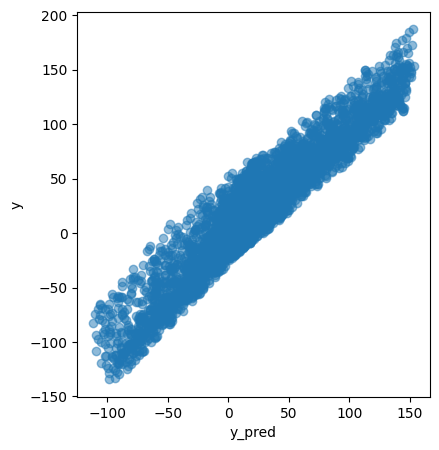

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

### Problem 4

In [ ]:
problem = Tree_Problem(x, y)
best_tree, best_MSE, fit_list, child, population = genetic_algorithm(
    problem,
)

<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


3.0776615582588247e-18


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

2.241225043297825e-18
0
2.241225043297825e-18
(((x[1] minimum x[1]) minimum x[0]) multiply (x[1] minimum x[0]))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

2.2173999365510976e-18
0
2.2173999365510976e-18
((((x[1] minimum x[1]) minimum x[0]) multiply (x[1] minimum x[0])) maximum sin(-18.5))


<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


2.301386189383925e-18
1
2.2173999365510976e-18
((((x[1] minimum x[1]) minimum x[0]) multiply (x[1] minimum x[0])) maximum sin(-18.5))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

1.6725472719539408e-18
0
1.6725472719539408e-18
(exp(x[1]) multiply x[0])


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

2.7420923723457006e-18
1
1.6725472719539408e-18
(exp(x[1]) multiply x[0])


<ipython-input-134-4074dd62cbe7>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.7366159333314583e-18
2
1.6725472719539408e-18
(exp(x[1]) multiply x[0])


<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:58: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


2.313932394771127e-18
3
1.6725472719539408e-18
(exp(x[1]) multiply x[0])


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

3.1974732061579448e-18
4
1.6725472719539408e-18
(exp(x[1]) multiply x[0])
1.4260283369018747e-18
0
1.4260283369018747e-18
((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1]))


<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.4259106632543999e-18
0
1.4259106632543999e-18
((tan((x[0] divide x[1])) minimum x[1]) maximum ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.4260283369018744e-18
1
1.4259106632543999e-18
((tan((x[0] divide x[1])) minimum x[1]) maximum ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))
1.739829176339933e-18
2
1.4259106632543999e-18
((tan((x[0] divide x[1])) minimum x[1]) maximum ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))
1.4228165375818915e-18
0
1.4228165375818915e-18
(((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])) maximum x[0])
1.4260283369018747e-18
1
1.4228165375818915e-18
(((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])) maximum x[0])
1.3048961630107204e-18
0
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.5323191719366493e-18
1
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))
1.4188474892270414e-18
2
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))
1.9140267902803506e-18
3
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))
3.277549138844735e-18
4
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))
2.7420923723457002e-18
5
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


2.7420923723457006e-18
6
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

1.6294991996962368e-18
7
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:58: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


1.925777887670206e-18
8
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

1.3315825314519555e-18
9
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


1.765997573210771e-18
10
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

1.3202673840905359e-18
11
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


1.915927355165376e-18
1
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

2.3273659197323764e-18
2
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))
1.3945312398076819e-18
3
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))
1.6725472719539408e-18
4
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.7406284668286256e-18
5
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: invalid value encountered in tan
  self.result=self.action(self.children[0].result)


2.3132305004504083e-18
6
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.3132305004504083e-18
7
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipytho

2.231471494244287e-18
8
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

2.231471494244287e-18
9
1.3048961630107204e-18
((x[0] multiply x[0]) multiply ((x[0] minimum x[1]) multiply (((x[0] multiply x[1]) multiply x[0]) maximum x[1])))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

8.151835609829086e-19
0
8.151835609829086e-19
(sqrt(abs)((-28.8 subtract x[0])) maximum exp((x[1] minimum x[0])))


<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


9.397297015725497e-19
1
8.151835609829086e-19
(sqrt(abs)((-28.8 subtract x[0])) maximum exp((x[1] minimum x[0])))


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

9.073723202603194e-19
2
8.151835609829086e-19
(sqrt(abs)((-28.8 subtract x[0])) maximum exp((x[1] minimum x[0])))
7.485825079865039e-19
0
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])
8.678862831771044e-19
1
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])
2.1566543518700104e-18
2
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])


<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-134-4074dd62cbe7>:49: RuntimeWarning: overflow encountered in exp
  self.result=self.action(self.children[0].result)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)


2.1566543518700104e-18
3
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])


<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encountered in square
  variance = np.mean((g_x - np.mean(g_x)) ** 2)
<ipython-input-134-4074dd62cbe7>:213: RuntimeWarning: overflow encoun

2.1566543518700104e-18
4
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])
2.7183884215608927e-18
5
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])
2.3886526310324452e-18
6
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])
2.7420923723457002e-18
7
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])
2.7183884215608927e-18
8
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])
2.3993297528597376e-18
9
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])


<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


4.307391733367257e-18
10
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])
3.554120514087309e-18
11
7.485825079865039e-19
(((x[0] maximum exp((x[1] minimum x[0]))) maximum -42.1) multiply x[0])


<ipython-input-134-4074dd62cbe7>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


In [ ]:
for i in range(100):
    cop_tree=copy.deepcopy(best_tree)
    cop_tree.modify_leaf_number()
    if cop_tree.MSE_flexible(y)<best_right_now.MSE_flexible(y):
        best_right_now=copy.deepcopy(cop_tree)

In [ ]:
best_right_now.MSE_flexible(y)

0.06845639701858083

In [ ]:
print("Best Formula:")
best_tree.print_text()
print("Best MSE:", best_MSE)

Best Formula:
((-42.5 multiply cos(x[1])) add sign(x[0]))
Best MSE: 0.020847071329855946


In [ ]:
import numpy as np

def compute_expression(x):
    """
    Calcule l'expression : (-42.5 * cos(x[1])) + sign(x[0])

    Args:
        x (array-like): Un tableau ou une liste contenant au moins deux éléments.

    Returns:
        float: Le résultat de l'expression.
    """
    if len(x) < 2:
        raise ValueError("L'array x doit contenir au moins deux éléments.")

    result = (-42.5 * np.cos(x[1])) + np.sign(x[0])
    return result


print(compute_expression(x))


[ 7.74319644  4.32820491 -7.85401529 ... 41.06079113 37.05866383
 40.91843927]


In [ ]:
best_right_now=compute_expression(x)

In [ ]:
best_right_now

array([ 7.74319644,  4.32820491, -7.85401529, ..., 41.06079113,
       37.05866383, 40.91843927])

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)

In [ ]:
alpha,beta

(-0.16470866767462639, 3.280924838467743)

Text(0, 0.5, 'y')

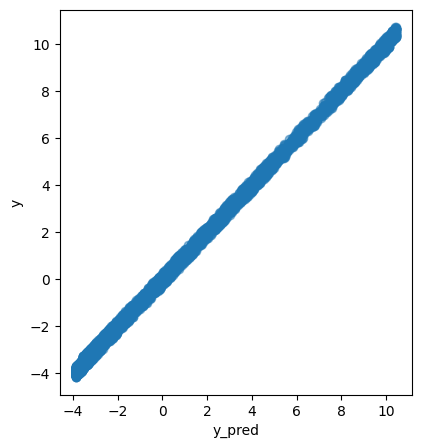

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

Text(0, 0.5, 'y')

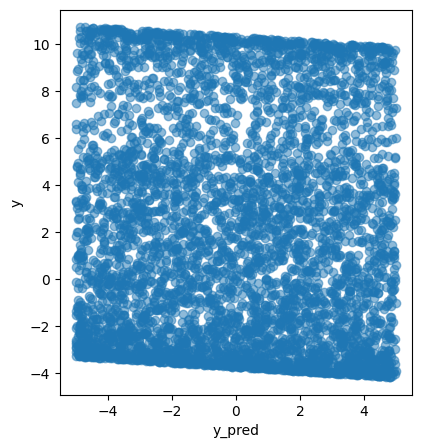

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(x[0], y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

Text(0, 0.5, 'y')

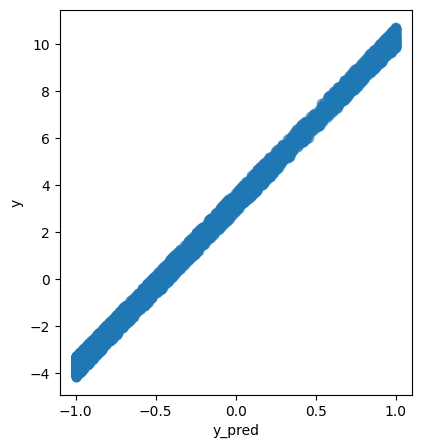

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(np.cos(x[1]), y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

Text(0.5, 1.0, 'Best solution score evolution for each iteration for problem 4')

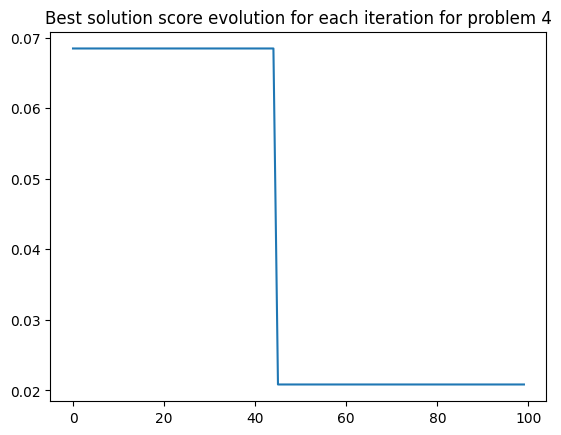

In [ ]:
plt.plot(fit_list)
plt.title("Best solution score evolution for each iteration for problem 4")

### Problem 5

In [ ]:
problem = Tree_Problem(x, y)
best_tree, best_MSE, fit_list, child, population = genetic_algorithm(problem)

<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.5268082764559597e-18


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.4271510534289953e-19
0
2.4271510534289953e-19
(log(abs)(x[0]) multiply exp((x[0] add x[1])))
2.2818432603811613e-19
0
2.2818432603811613e-19
(((x[1] maximum 5.8) maximum log10(abs)(x[1])) add exp((x[0] add x[1])))
8.654094278110925e-20
0
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.284349444610851e-19
1
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.6052613042234313e-18
2
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.670993194149378e-18
3
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.7559100857205413e-18
4
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.648364272051283e-18
5
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.247338490206213e-18
6
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.930521191300811e-18
7
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.313932394771127e-18
8
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.1566543518700104e-18
9
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.296697678470616e-18
10
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.063473597456472e-18
11
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


9.434501684401055e-19
1
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.0629739122201595e-18
2
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
9.300689908794748e-19
3
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
8.998778468727765e-19
4
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
6.87551027425318e-19
5
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.1566543518700104e-18
6
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.8718471810099565e-18
7
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.6725472719539408e-18
8
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.3059603792550785e-18
9
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.287355602831252e-18
10
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.126308376191192e-18
11
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)


2.1313776416351017e-18
1
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.1729446781091863e-18
2
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.45045623881728e-18
3
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.871370735265804e-18
4
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.013173021709504e-18
5
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.846375904116799e-18
6
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.8660234447953548e-18
7
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


7.856964119985513e-19
8
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.0101780017181379e-18
9
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
7.856964119985513e-19
10
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.7116803416233633e-18
11
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.7079496147291608e-18
1
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.6412201213909263e-18
2
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.7881860869342857e-18
3
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.7116803416233633e-18
4
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)


2.2230313179414942e-18
5
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.0076414719122507e-18
6
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in tan
  self.result=self.action(self.children[0].result)


7.821639604165756e-19
7
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.0018331616777025e-18
8
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


5.214627289210255e-19
9
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.5799808043784485e-18
10
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.0742626997255513e-18
11
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in tan
  self.result=self.action(self.children[0].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum

2.594232912063827e-18
1
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1.87313104636463e-18
2
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.771478033447291e-18
3
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.1566543518700104e-18
4
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.1424045671599733e-18
5
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
2.1501756241669637e-18
6
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.1566543518700104e-18
7
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: invalid value encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-in

1.7932267412915902e-18
8
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.871370735265804e-18
9
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.1352845904643674e-18
10
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))
1.1352510131359054e-18
11
8.654094278110925e-20
(x[1] multiply (((x[1] maximum tan(5.8)) maximum log10(abs)(x[1])) add exp((x[0] add x[1]))))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: invalid value encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


8.612864376952933e-20
0
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: invalid value encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


3.2166696658146416e-19
1
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.113526202477906e-19
2
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
2.2780637223151314e-19
3
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
2.2780637223151314e-19
4
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.1501281944180133e-19
5
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


3.222053002527847e-19
6
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
3.231639657038608e-19
7
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
2.7486939802428266e-18
8
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
2.7183884215608923e-18
9
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
1.7989019189930145e-18
10
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
2.7179562551843306e-18
11
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimu

<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)


7.830914383940353e-19
3
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
1.54820098226112e-19
4
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
1.3756139485124488e-18
5
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


1.5560500278656268e-18
6
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)


2.2563358893205195e-18
7
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.3139323947711275e-18
8
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-170-4672863aff75>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


2.3139323947711275e-18
9
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))
2.224289284701236e-18
10
8.612864376952933e-20
(((0.7 add exp((x[0] add x[1]))) maximum (x[0] minimum ((x[1] maximum x[1]) multiply log(abs)(x[1])))) multiply (x[1] minimum x[1]))


In [ ]:
np.seterr(over='ignore')  # Ignore overflow warnings


{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [ ]:
best_right_now=copy.deepcopy(best_tree)
for i in range(10000):
    cop_tree=copy.deepcopy(best_tree)
    cop_tree.modify_leaf_number()
    if cop_tree.MSE_flexible(y)<best_right_now.MSE_flexible(y):
        best_right_now=copy.deepcopy(cop_tree)

In [ ]:
def calculate_expression(x):
    return np.exp(np.maximum(x[0], x[0] + x[1])) * x[1]

In [ ]:
y_pred_5=calculate_expression(x)

In [ ]:
node_5=Node(problem,leaf=True,result=y_pred_5)

In [ ]:
best_right_now.MSE_flexible(y)

8.54417501633285e-20

In [ ]:
best_tree.text

'(x[1] multiply (((x[0] multiply x[0]) multiply (exp(x[1]) multiply x[0])) multiply x[0]))'

Text(0, 0.5, 'y')

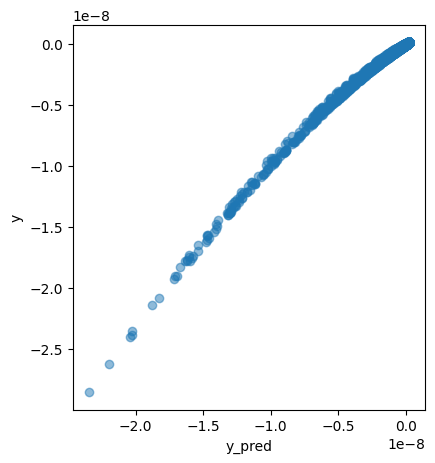

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

In [ ]:
alpha,beta

(-5.4509089425111764e-14, 2.3930585966024667e-10)

Text(0.5, 1.0, 'Best solution score evolution for each iteration for problem 5')

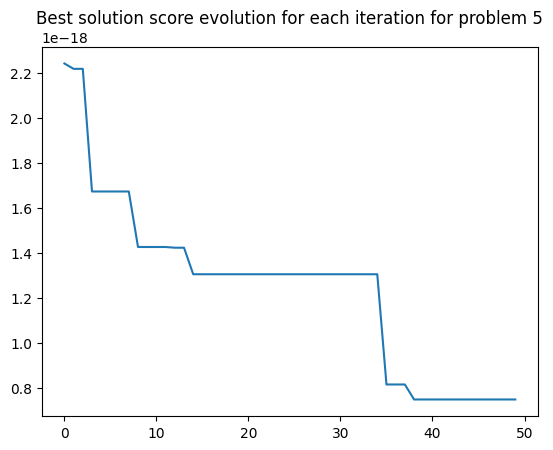

In [ ]:
plt.plot(fit_list)
plt.title("Best solution score evolution for each iteration for problem 5")

### Problem 6

In [ ]:
print("Best Formula:")
best_tree2.print_text()
print("Best MSE:", best_MSE2)

Best Formula:
(((-11.856588799999997 divide ((x[1] add x[1]) subtract (-26646.855588281243 add x[0]))) subtract (((x[1] add x[1]) subtract (-12251.427856681032 add x[0])) divide (x[0] add [-75363.71813926 -75363.71813926 -75363.71813926 ... -75363.71813926
 -75363.71813926 -75363.71813926]))) multiply ([-1224071.64071506 -1224071.64071506 -1224071.64071506 ...
 -1224071.64071506 -1224071.64071506 -1224071.64071506] subtract (((x[1] add x[1]) subtract (-1317.3578340517238 add x[0])) divide (x[0] add [-474791.42427736 -474791.42427736 -474791.42427736 ... -474791.42427736
 -474791.42427736 -474791.42427736]))))
Best MSE: 0.0008021687993726896


Text(0.5, 1.0, 'Best solution score evolution for each iteration for problem 6')

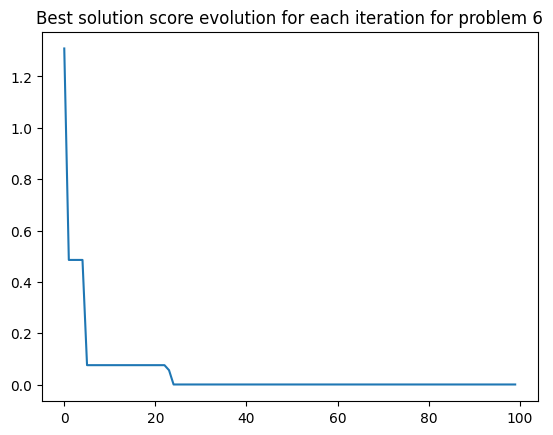

In [ ]:
plt.plot(fit_list2)
plt.title("Best solution score evolution for each iteration for problem 6")

In [ ]:
alpha,beta=best_tree2.calculate_alpha_beta(y)

In [ ]:
alpha

-0.051935559371433154

In [ ]:
beta

-10306.35779974637

In [ ]:
best_tree2.text

'((((x[1] subtract (x[0] subtract x[1])) multiply (x[0] subtract 52.83890500958704)) subtract ((151.42332652340602 subtract 55.398777996368054) subtract (-0.022357809877549945 multiply -0.2512990633522041))) divide (-39.077412656897145 add -0.0747240676630231))'

Text(0, 0.5, 'y')

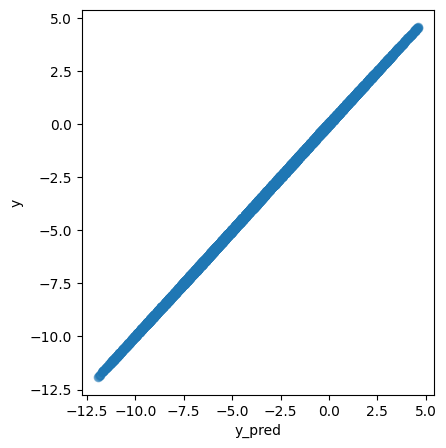

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree2.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')


In [ ]:
import numpy as np

def calculate_expression(x):
    return (-0.051935559371433154) * ((-11.856588799999997 / ((x[1] + x[1]) - (-26646.855588281243 + x[0])) -
                                       ((x[1] + x[1]) - (-12251.427856681032 + x[0])) / (x[0] - 75363.71813926)) *
                                      (-1224071.64071506 - (((x[1] + x[1]) - (-1317.3578340517238 + x[0])) / (x[0] - 474791.42427736)))) - 10306.35779974637


In [ ]:
real_result=calculate_expression(x)

In [ ]:
alpha,beta

(-0.051935559371433154, -10306.35779974637)

In [ ]:
mean_squared_error(real_result,y)

0.0008021687993723364

Text(0, 0.5, 'y')

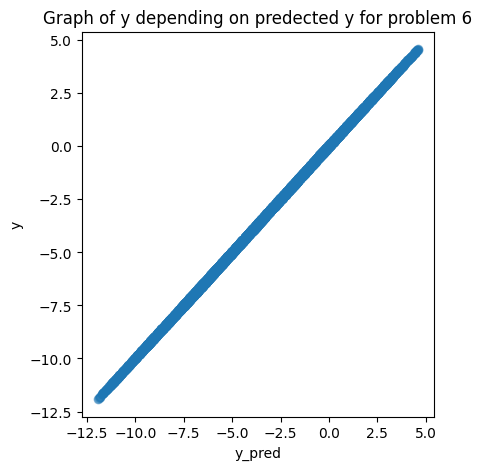

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(real_result, y, alpha=0.5)
plt.title("Graph of y depending on predected y for problem 6")
plt.xlabel('y_pred')
plt.ylabel('y')


### Problem 7

In [ ]:
problem = Tree_Problem(x, y)
best_tree, best_MSE, fit_list, child, population = genetic_algorithm(problem)

<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)


520.09636499594


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

533.658440931945
1
520.09636499594
((sign((x[0] multiply x[1])) maximum square((x[1] minimum x[1]))) minimum (((x[1] subtract x[1]) subtract (x[0] add x[1])) multiply ((x[0] maximum x[0]) maximum -36.0)))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

458.6844341016517
0
458.6844341016517
log(abs)((x[0] subtract x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning:

533.658440931945
1
458.6844341016517
log(abs)((x[0] subtract x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

533.658440931945
2
458.6844341016517
log(abs)((x[0] subtract x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

134.54298351617325
0
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

302.565490374918
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

533.658440931945
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

306.50431854645086
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

306.50431854645086
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

458.6844341016517
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

585.7222513879543
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

512.1057492070889
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: i

512.1057492070889
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

501.3000288533235
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in subtract
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b

462.66882479787023
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

493.6320452758831
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:58: RuntimeWarning: invalid value encountered in tan
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarnin

459.7717707886942
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

459.7717707886942
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

474.09663935372055
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b98

512.4884404836013
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: 

533.658440931945
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning

608.4381918790922
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

590.8976090680248
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

559.1231048575954
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b9

534.1975460842818
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

488.28022934546823
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

464.2506684354706
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: inval

464.2506684354706
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

533.658440931945
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

408.8613108370021
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

474.16277959628945
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

433.73857327729763
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

529.2020512949374
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b98

393.1456273247371
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

394.1184549027928
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

474.1627795962895
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

474.1627795962895
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

412.39066881638763
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:58: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarnin

609.9079304423267
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountere

533.658440931945
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

544.8439664392972
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

327.18445466087553
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

329.7901615609726
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: 

462.66882479787023
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in multiply
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b9

329.7901615609726
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

329.7901615609726
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

329.7901615609726
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

332.1076190441574
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encounter

332.50012601959673
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value e

336.2737229411498
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

368.28932013273345
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b98

368.28932013273345
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

368.28932013273345
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

430.90577036687154
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

329.7901615609726
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

368.28932013273345
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

348.27429350047623
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

348.27429350047623
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

348.27569380202834
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

665.2376045441846
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

679.486646349929
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

454.65628723724654
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in sin
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: 

454.65628723724654
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

521.4379087341366
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

511.73599772377264
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

511.73599772377264
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:58: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: 

511.73542474569314
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encounter

533.658440931945
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

533.658440931945
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

422.95752078556853
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value e

422.95752078556853
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

423.38857217363676
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b9

423.38857217363676
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

329.7901615609726
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

421.83815206439886
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

423.3885721736369
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

453.54227424325563
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

423.38857217363676
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

531.1893407423679
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

465.29183578918827
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

387.4373916093729
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

509.6802042787995
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

510.1051912899319
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where

467.3120654368253
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

452.68429301565254
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

452.21815172671694
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

533.658440931945
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

467.3120654368253
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

470.41041988793427
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid

466.95208053383453
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

450.7691193476486
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

450.7608728115976
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

450.7608728115976
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered i

443.6863973447213
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

467.3791536068706
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

466.65502748058486
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

467.3623256650889
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

462.99592318785096
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in multiply
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b9

527.4672577170614
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

329.7901615609726
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

373.0131108945664
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

348.5093768300637
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985f

413.2402400591806
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

335.29917332718856
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b98

341.07825942861626
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

341.07825942861626
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

367.3101994574439
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

340.6548294809801
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value e

438.22392301661216
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

347.6324022651348
6
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

341.07825942861626
7
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b9

341.07825942861626
8
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496

342.40175371932827
9
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

345.28425411144633
10
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value e

345.82676833022276
11
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

462.86480403237266
1
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc

332.1122091897156
2
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b

351.86994466974977
3
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-55-9496b985fc6a>:213: RuntimeWarning: invalid value encounter

524.2189569006634
4
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985fc6a>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-55-9496b985

533.658440931945
5
134.54298351617325
square(((log(abs)((x[0] subtract x[1])) multiply x[0]) multiply x[1]))


In [ ]:
print("Best Formula:")
best_tree.print_text()
print("Best MSE:", best_MSE)

Best Formula:
(log(abs)((x[1] subtract x[0])) multiply ((x[1] maximum x[1]) multiply (x[1] divide (x[1] divide x[0]))))
Best MSE: 298.44707788064346


Text(0, 0.5, 'y')

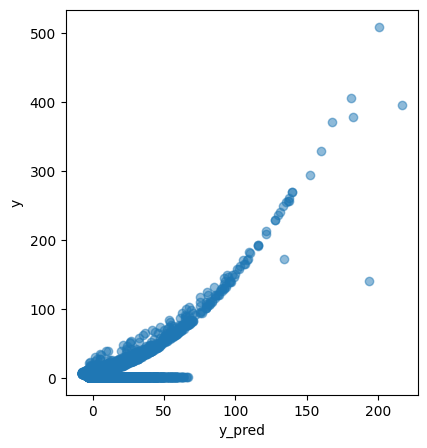

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

In [ ]:
alpha, beta

(-13.30888021787793, -2.532233896849151)

Text(0, 0.5, 'y')

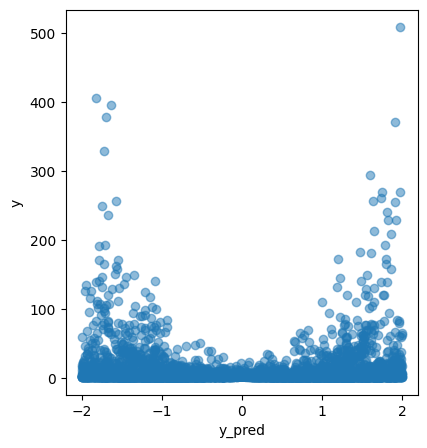

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(x[0], y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

### Problem 8


In [ ]:
x.shape

(6, 50000)

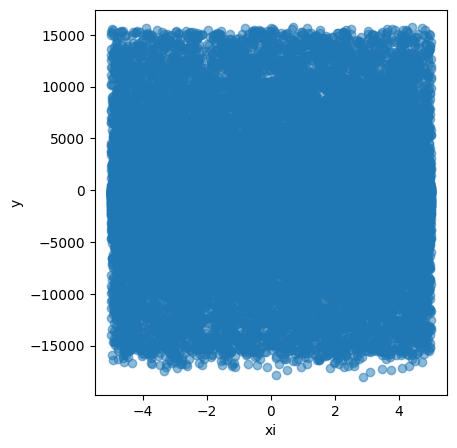

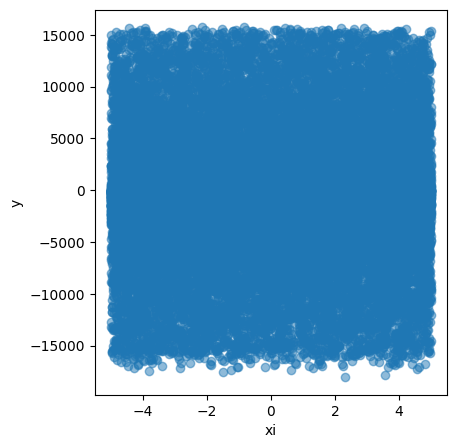

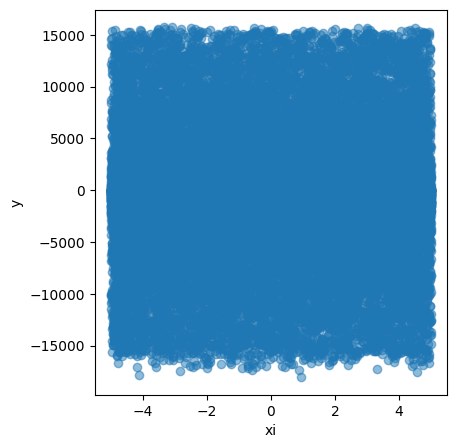

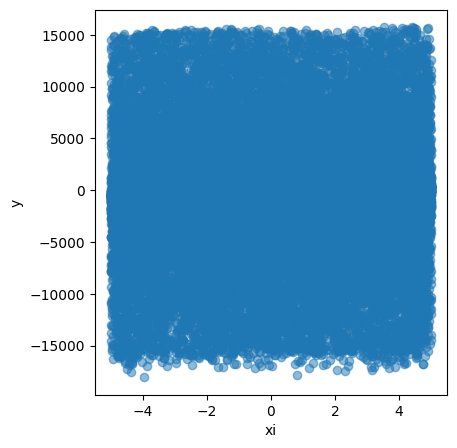

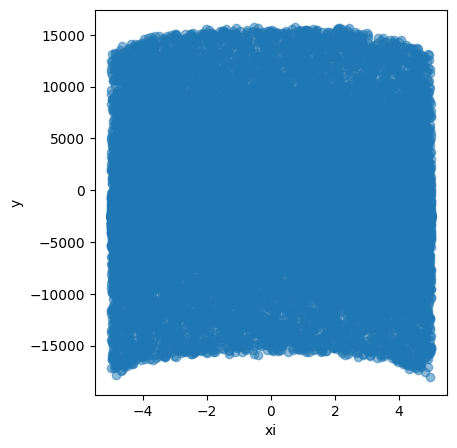

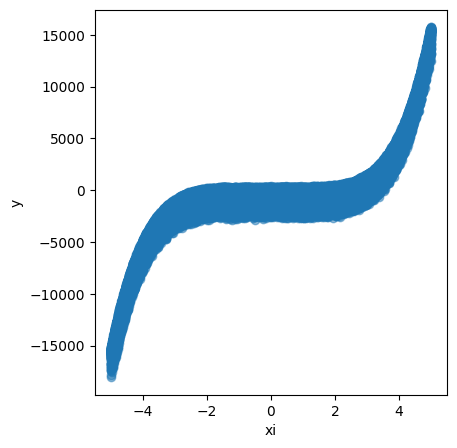

In [ ]:
for i in range(x.shape[0]):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x[i], y, alpha=0.5)
    plt.xlabel('xi')
    plt.ylabel('y')

In [ ]:
problem = Tree_Problem(x_prime, y)
best_tree, best_MSE, fit_list, child, population = genetic_algorithm(problem)

<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:49: RuntimeWarning: invalid value encountered in tan
  self.result=self.action(self.children[0].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/

1557970.0842608425


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce

1638876.742014755
1
1557970.0842608425
x[6]


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce

465599.15854892455
0
465599.15854892455
((x[6] maximum x[6]) multiply square(x[5]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

462357.1391401684
0
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
1
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce

1557970.0842608425
2
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  se

1557970.0842608425
3
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / v

1557970.0842608425
4
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44:

1557970.0842608425
5
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_

1557970.0842608425
6
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=wh

1636398.4384069056
7
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
8
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
9
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608423
10
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=wh

1557970.0842608425
11
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1366614.9737967364
1
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55:

1366614.9737967364
2
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else

1383979.8474418228
3
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

5267779.713055003
4
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55:

1557970.0842608425
5
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else

1557970.0842608425
6
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
7
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else

1557970.0842608425
8
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, d

1557937.8858330597
9
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
10
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
11
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
1
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_

1557970.0842608425
2
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1660803.6206465734
3
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, ke

1557970.0842608425
4
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/p

1557970.0842608425
5
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
6
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1529229.7922100183
7
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608435
8
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=wh

1557970.0842608425
9
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

7730638.920952673
10
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
11


<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)


462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44:

959318.661690518
1
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55:

842057.2169505957
2
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
3
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
4
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / v

1551767.2718437342
5
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55

1557970.0842608425
6
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered i

1557970.0842608425
7
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in s

1557970.0842608425
8
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
9
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.075748641
10
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
11
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered 

1558005.1156529745
1
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1555725.2644395272
2
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:4

1557970.0842608425
3
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608423
4
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
5
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
6
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
7
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44:

1557970.0842608425
8
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
9
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
10
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
11


<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:49: RuntimeWarning: invalid value encountered in cos
  self.result=self.action(self.children[0].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, d

1557970.0842608425
1
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, d

1557970.0842608425
2
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / v

1557970.0842608425
3
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1564983.779921579
4
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

7849323.510066247
5
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1455908.2426823538
6
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
7
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
8
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:5

1557970.0842608425
9
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
/usr/local/lib/python3.11/dist-pac

1557970.0842608425
10
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
11


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)


462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:5

1557970.0842608425
1
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in s

1548565.8349847565
2
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
3
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44:

1557970.0842608425
4
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else

5198183.72798648
5
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: divide by zero encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:

5353117.444705386
6
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, d

1557970.084260843
7
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

1557970.0842608425
8
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invali

8267780.006482735
9
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:44: RuntimeWarning: invalid value encountered in power
  self.result=self.action(self.children[0].result,self.children[1].result)
<ipython-input-9-621a3774145f>:55:

1557970.0842608425
10
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-9-621a3774145f>:213: RuntimeWarning: invalid value encountered in scalar divide
  alpha = covariance / variance if variance != 0 else 0.0
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=wh

1557970.0842608425
11
462357.1391401684
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))


<ipython-input-9-621a3774145f>:44: RuntimeWarning: divide by zero encountered in divide
  self.result=self.action(self.children[0].result,self.children[1].result)


In [ ]:
print("Best Formula:")
best_tree.print_text()
print("Best MSE:", best_MSE)

Best Formula:
(((x[6] maximum x[6]) multiply square(x[5])) add (x[4] add x[3]))
Best MSE: 462357.1391401684


Text(0, 0.5, 'y')

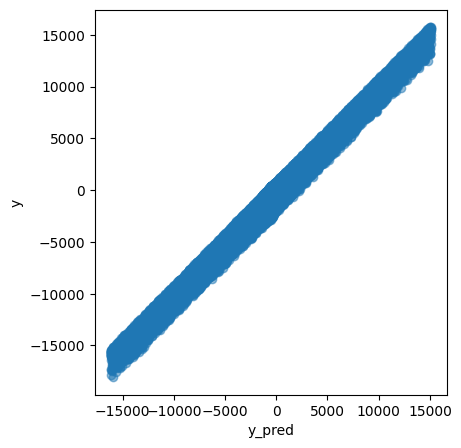

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

In [ ]:
alpha,beta

(5.00273373222205, -520.3818751347435)

In [ ]:
print("Best Formula:")
best_tree.print_text()
print("Best MSE:", best_MSE)

Best Formula:
(x[5] multiply square(x[5]))
Best MSE: 1557970.0842608425


Text(0, 0.5, 'y')

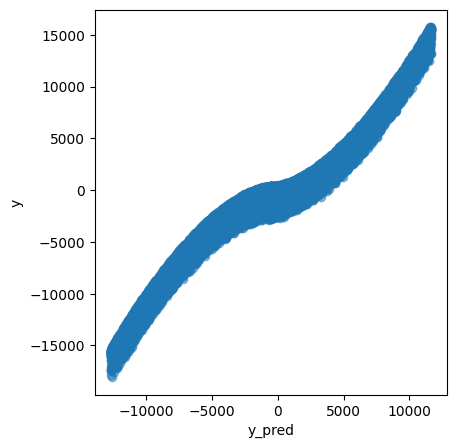

In [ ]:
alpha,beta=best_tree.calculate_alpha_beta(y)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(alpha*best_tree.result+beta, y, alpha=0.5)
plt.xlabel('y_pred')
plt.ylabel('y')

In [ ]:
alpha,beta

(97.30189968055524, -521.023425040695)